In [136]:
# Check free memory available
%system free -m

['               total        used        free      shared  buff/cache   available',
 'Mem:           15000        4622        7007           0        3370       10072',
 'Swap:              0           0           0']

In [137]:
#! pip install pandas_gbq
#! pip install panel
#! pip install hvplot

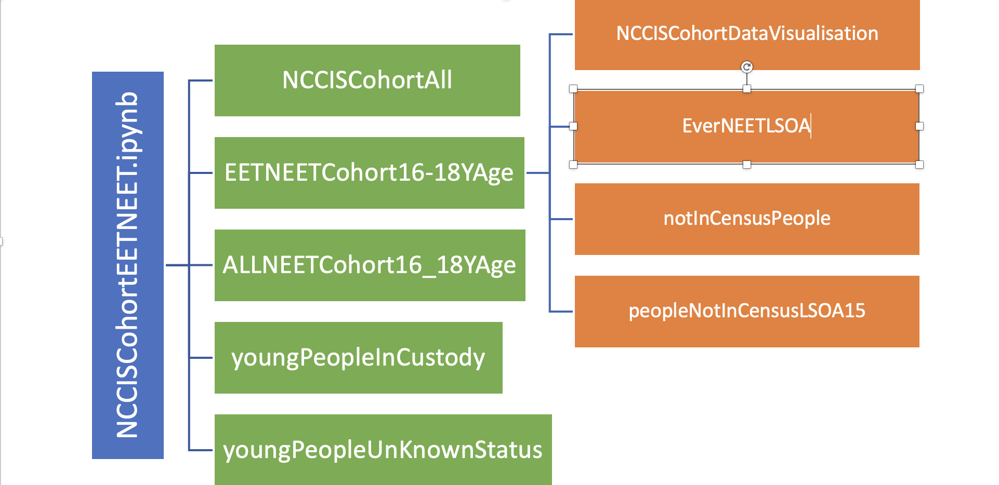

In [138]:
# Import required libraries
from google.cloud import bigquery
import gc
from dateutil.relativedelta import relativedelta
import numpy as np
import math
import os
import pandas_gbq as pdg
import pandas as pd
import panel as pn
pn.extension('tabulator')
import hvplot.pandas

In [139]:
# to run locally 
# panel serve Interactive_dashboard.ipynb

In [140]:
#PLOT_OUTPUT_LOCATION = "reports/figures/"
def returnPlotLocation():
    PLOT_OUTPUT_LOCATION = "reports/figures/"
    return PLOT_OUTPUT_LOCATION

In [141]:
def retINTERIM_DATA_LOCATION():
    INTERIM_DATA_LOCATION = "data/interim/"
    return INTERIM_DATA_LOCATION

In [142]:
def NCCISCohortAll():
    return pd.read_csv(retINTERIM_DATA_LOCATION() + "NCCISCohortAll.csv")

In [143]:
def EETNEETCohort1618YAge():
    return pd.read_csv(retINTERIM_DATA_LOCATION() + "EETNEETCohort16-18YAge.csv")

In [144]:
def EverNEETLSOA():
    return pd.read_csv(retINTERIM_DATA_LOCATION() + "EverNEETLSOA.csv")

In [145]:
def EETLSOA():
    return pd.read_csv(retINTERIM_DATA_LOCATION() + "EETLSOA.csv")

In [146]:
EETNEETVisualisation = EETNEETCohort1618YAge()

In [147]:
EETNEETVisualisation.columns

Index(['person_id', 'CurrentActivityCode', 'academicyear', 'year_month_birth',
       'Age', 'gender', 'ethinicity', 'AcademicBegin', 'AcademicEnd',
       'academic_start_date', 'academic_end_date', 'No_of_days_neet',
       'No_of_months_neet', 'total_non_neet_observations',
       'total_neet_observations', 'total_observations',
       'custody_offender_observations', 'status_unknown_observations',
       'EverNeetStatus', 'Learning_disability', 'SENDFlag'],
      dtype='object')

In [148]:
EETNEETVisualisation = EETNEETVisualisation.fillna(0)
#EETNEETVisualisation['academic_start_date'] = pd.to_datetime(EETNEETVisualisation['academic_start_date'])
EETNEETTRue = EETNEETVisualisation.query('total_neet_observations>=1')
EETNEETFalse = EETNEETVisualisation.query('total_neet_observations==0')

In [149]:
NoOfMonthsNEETPersonCNT = EETNEETTRue.groupby(["No_of_months_neet"]).agg(
    { 'person_id':'count','total_neet_observations':'max',
     'total_observations':'max', 'AcademicBegin':'max'}).assign(neet_Ratio= lambda df: df["total_neet_observations"] / df["total_observations"]).sort_values(['No_of_months_neet','AcademicBegin'])
NoOfMonthsNEETPersonCNT["neet_Ratio"] = np.round(NoOfMonthsNEETPersonCNT["neet_Ratio"],2)
NoOfMonthsNEETPersonCNT = NoOfMonthsNEETPersonCNT.reset_index()
NoOfMonthsNEETPersonCNT

,No_of_months_neet,person_id,total_neet_observations,total_observations,AcademicBegin,neet_Ratio
0,0,49488,29,68,2018,0.43
1,1,547,30,42,2018,0.71
2,2,883,26,48,2018,0.54
3,3,874,24,48,2018,0.50
4,4,1083,31,48,2018,0.65
5,5,1050,30,47,2018,0.64
6,6,970,25,51,2018,0.49
7,7,1048,24,47,2018,0.51
8,8,1009,25,44,2018,0.57
9,9,831,23,48,2018,0.48


In [150]:
EETNEETVisual = NoOfMonthsNEETPersonCNT.interactive()
NEETVisualInteractive = EETNEETTRue.interactive()
EETVisualInteractive = EETNEETFalse.interactive()
EETNEETDisplay = EETNEETVisualisation.interactive()


In [151]:
NEETVisualInteractive.dtypes

In [152]:
   # Define Panel widgets
year_slider = pn.widgets.IntSlider(name='Academic Year slider', start=2011, end=2019, step=1, value=2019)
year_slider

IntSlider(end=2019, name='Academic Year slider', start=2011, value=2019)

In [153]:
    # Radio buttons for NEET EET measures
yaxis_NCCIS = 'person_id'
# pn.widgets.RadioButtonGroup(
#     name='Y axis', 
#     options=['person_id',],
#     button_type='success'
# )

<div class="alert alert-block alert-warning">
    <H3> # Data Visualisation based on the Academic year vs NEET Status # </H3>

</DIV>

In [154]:
def chartPipeline(dfInteractive,ChartTitle):
    Gender = ['Male', 'Female','U','F','M', 'I','1']

    NCCIS_pipeline = (
        dfInteractive[
            (dfInteractive.AcademicBegin <= year_slider) &
            (dfInteractive.gender.isin(Gender))
        ]
        .groupby(['gender', 'AcademicBegin'])[yaxis_NCCIS].nunique()
        .to_frame()
        .reset_index()
        .sort_values(by='AcademicBegin')  
        .reset_index(drop=True)
    )
    NCCIS_plot = NCCIS_pipeline.hvplot(x = 'AcademicBegin', by='gender', 
                                       y=yaxis_NCCIS,line_width=2, title=ChartTitle)
    return NCCIS_plot
    

In [155]:
NCCISNEET_plot = chartPipeline(NEETVisualInteractive, "NEET count by Gender Over Academic Year")
NCCISNEET_plot

/opt/conda/lib/python3.10/site-packages/holoviews/core/data/pandas.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return dataset.data.dtypes[idx].type
/opt/conda/lib/python3.10/site-packages/holoviews/core/data/pandas.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return dataset.data.dtypes[idx].type


In [156]:
NCCISEET_plot = chartPipeline(EETVisualInteractive, "EET count by Gender Over Academic Year")
NCCISEET_plot

/opt/conda/lib/python3.10/site-packages/holoviews/core/data/pandas.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return dataset.data.dtypes[idx].type
/opt/conda/lib/python3.10/site-packages/holoviews/core/data/pandas.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return dataset.data.dtypes[idx].type


<div class="alert alert-block alert-warning">
    <H3> # Creating Bar chart Activity codes people count # </H3>

</DIV>

In [157]:
yaxis_NCCIS_source = 'person_id'
# = pn.widgets.RadioButtonGroup(
#    name='Y axis', 
    #options=['person_id','neet_Ratio'], 
    #button_type='success'
#)
#ActivityCodes = [510,520,530,540,610,611,612,613,614,615,616,617, 618,619,620,630,640,650,660,670,680]
months_neet = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]
NCCIS_source_bar_pipeline = (
    EETNEETVisual[
        (EETNEETVisual.AcademicBegin <= year_slider) &
        (EETNEETVisual.No_of_months_neet.isin(months_neet))
    ]
    .groupby(['No_of_months_neet'])[yaxis_NCCIS_source].sum()
    .to_frame()
    .reset_index()
    .sort_values(by='No_of_months_neet')  
    .reset_index(drop=True)
)

In [158]:
#EETNEETVisual

In [159]:
NCCIS_source_bar_plot = NCCIS_source_bar_pipeline.hvplot(kind='bar', 
                                                     x='No_of_months_neet', 
                                                     y=yaxis_NCCIS_source, 
                                                     height =500,
                                                     width = 500,
                                                     color='gold',
                                                     title='Duration of Being NEET vs Count of People')
NCCIS_source_bar_plot

/opt/conda/lib/python3.10/site-packages/holoviews/core/data/pandas.py:30: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  return dataset.data.dtypes[idx].type


In [160]:
yaxis_NCCISCODE_source = 'person_id'

#pn.widgets.RadioButtonGroup(
#     name='Y axis', 
#     options=['person_id'], 
#     button_type='success'
# )
ActivityCodes = [510,520,530,540,610,611,612,613,614,615,616,617, 618,619,620,630,640,650,660,670,680]
#months_neet = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]
NCCISCODE_source_bar_pipeline = (
    NEETVisualInteractive[
        (NEETVisualInteractive.CurrentActivityCode.isin(ActivityCodes))
    ]
    .groupby(['CurrentActivityCode','gender'])[yaxis_NCCISCODE_source].count()
    .to_frame()
    .reset_index()
    .sort_values(by='CurrentActivityCode')  
    .reset_index(drop=True)
)

In [164]:
# ! python -m pip install numpy==1.23.1


In [166]:
NCCISCODE_source_bar_plot = NCCISCODE_source_bar_pipeline.hvplot(kind='bar', 
                                                    stacked=True,
                                                    legend="top_left", 
                                                     height=500,
                                                     x='CurrentActivityCode', 
                                                     by='gender',
                                                     y=yaxis_NCCISCODE_source, 
                                                     title='Activity Code Vs NEET count', 
                                                     width=1000)

# NCCISCODE_source_bar_plot

<div class="alert alert-block alert-warning">
    <H3> # Creating Dashboard # </H3>

</DIV>

In [167]:
#Layout using Template
#template = pn.template.FastListTemplate(
#    title='EET / NEET metrics dashboard', 
#    sidebar=[pn.pane.Markdown("# NEET - EYFSP"), 
#             pn.pane.Markdown("#### Using data analytics to inform the prevention of NEET – Exploring Early Educational Assessments The current research project centres on the investigation of specific components within the Good Level of Development (GLD) indicator, part of the Early Years Foundation Stage Profile (EYFSP). The EYFSP assesses a child's readiness for school after completing the reception year of primary education. This project seeks to determine which components within the EYFSP are most predictive of diverse outcomes, including the risk of becoming NEET later in life.."), 
#             #pn.pane.PNG('climate_day.png', sizing_mode='scale_both'),
#             pn.pane.Markdown("## Settings"),   
#             year_slider],
#    main=[pn.Row(pn.Column(yaxis_NCCIS, 
#                           NCCISNEET_plot.panel(width=700), margin=(0,25)), 
#                 NCCISEET_plot.panel(width=500)), 
#          pn.Row(pn.Column(yaxis_NCCIS_source,NCCIS_source_bar_plot.panel(width=600), margin=(0,25)), 
#                 pn.Column(yaxis_NCCISCODE_source, NCCISCODE_source_bar_plot.panel(width=600)))],
#    accent_base_color="#88d8b0",
#    header_background="#88d8b0",
#)
#template.show()
#template.servable();

In [168]:
#! panel serve NCCISCohortDataVisualisation.ipynb

In [169]:
person_count = EETNEETVisualisation["person_id"].nunique()
person_count

93661

In [170]:
NEETCount = EETNEETTRue["person_id"].nunique()
EETCount = EETNEETFalse["person_id"].nunique()

In [171]:
NEETCount

14013

In [172]:
EETCount

79648

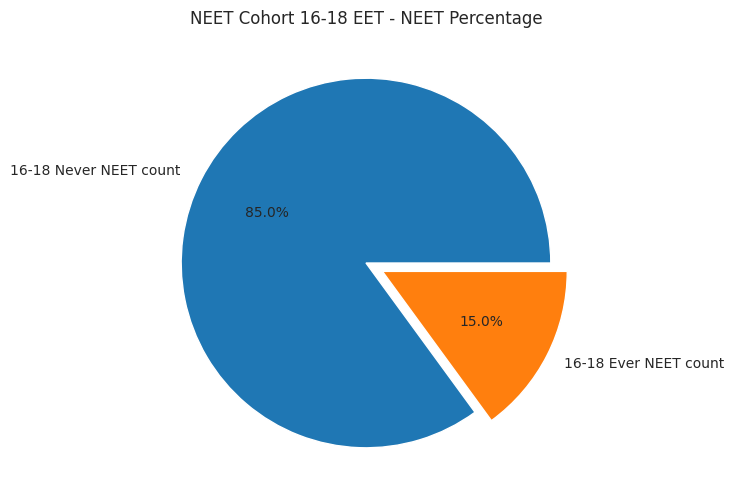

<Figure size 640x480 with 0 Axes>

In [173]:
import seaborn as sns
import matplotlib.pyplot as plt
#import pandas as pd

OverallNCCISCount = 112056-94515


# Explode Shoes slice
explode = [ 0, 0.1]


# data = {'labels': ['NCCIS Cohort', '16-18 Cohort count', '16-18 Never NEET count ', '16-18 Ever NEET count'],
#         'values': [OverallNCCISCount,person_count, EETCount, NEETCount]}

data = {'labels': ['16-18 Never NEET count ', '16-18 Ever NEET count'],
        'values': [EETCount, NEETCount]}
df = pd.DataFrame(data)

sns.set_style("whitegrid")
plt.figure(figsize=(6,6))
plt.pie(df['values'], labels=df['labels'], autopct='%1.1f%%', explode=explode)
plt.title('NEET Cohort 16-18 EET - NEET Percentage')
plt.show()
plt.savefig(returnPlotLocation() + "PieChartDistribution", dpi=300)

In [174]:
# # Instaniate BigQuery client

# sqlLSOAFormat = """ SELECT *
# FROM yhcr-prd-phm-bia-core.CB_2166.EverNEETLSOA; """

# LSOA_FM = pdg.read_gbq(sqlLSOAFormat, dialect='standard')



In [175]:
NEET_LSOA_format = EverNEETLSOA()
# EET_LSOA_format = EETLSOA()

<div class="alert alert-block alert-success">
<h2> # Filtering records pertaining to Bradford only ans Age of the student when they were 16 - 18 with LSOA at 15 #</h2>
</div>

In [176]:
NEET_LSOA_format = NEET_LSOA_format.query('LSOA_name.str.contains("Bradford") == True')
# EET_LSOA_format = EET_LSOA_format.query('LSOA_name.str.contains("Bradford") == True')

In [177]:
# EET_LSOA_format = EET_LSOA_format.drop(['Age','FSMEligible','EntitlementFlag','CurrentActivityCode','year_month_birth','academic_start_date','custody_offender_observations','status_unknown_observations','FreeSchoolMeal'],axis=1)
# EET_LSOA_format = EET_LSOA_format.drop_duplicates()
# EET_LSOA_format

In [178]:
NEET_LSOA_format = NEET_LSOA_format.drop(['Age','CurrentActivityCode','year_month_birth','academic_start_date','custody_offender_observations','status_unknown_observations'],axis=1)
NEET_LSOA_format = NEET_LSOA_format.drop_duplicates()
NEET_LSOA_format

,person_id,gender,ethinicity,total_neet_observations,LSOA,FSMEligible,InCareAtCurrentSchool,Disability,FreeSchoolMeal,EntitlementFlag,LSOA_name,geometry_home,lat_long
0,189,M,English,8,E01010618,False,"<BooleanArray>\n[]\nLength: 0, dtype: boolean",NCOL,True,False,Bradford 038A,"POLYGON((-1.71162851108778 53.8001348339413, -...",POINT(-1.71162 53.7977)
17,1096,F,Asian,2,E01010629,False,"<BooleanArray>\n[]\nLength: 0, dtype: boolean",NCOL,"<BooleanArray>\n[]\nLength: 0, dtype: boolean",False,Bradford 040B,"POLYGON((-1.79921021596507 53.8014358261807, -...",POINT(-1.80933 53.8009)
22,1646,F,English,12,E01010587,False,False,[],"<BooleanArray>\n[]\nLength: 0, dtype: boolean",False,Bradford 022B,"POLYGON((-1.84982910299211 53.8437447691668, -...",POINT(-1.8503 53.8273)
43,2889,M,English,2,E01010781,False,"<BooleanArray>\n[]\nLength: 0, dtype: boolean",NCOL,"<BooleanArray>\n[]\nLength: 0, dtype: boolean",False,Bradford 021D,"POLYGON((-1.74998959724743 53.8391127675587, -...",POINT(-1.7538 53.8347)
48,3559,M,Unknown/Refuse to say,2,E01010758,False,False,[],"<BooleanArray>\n[]\nLength: 0, dtype: boolean",False,Bradford 058E,"POLYGON((-1.85674103077716 53.7710744553364, -...",POINT(-1.86068 53.7665)
...,...,...,...,...,...,...,...,...,...,...,...,...,...
60249,13762514,M,Asian,17,E01010599,False,False,[],True,False,Bradford 028C,"POLYGON((-1.75183415165545 53.8178385713611, -...",POINT(-1.75284 53.8157)
60253,13762711,M,English,10,E01010832,True,"<BooleanArray>\n[]\nLength: 0, dtype: boolean",[],True,False,Bradford 035E,"POLYGON((-1.72813133226862 53.8092355000837, -...",POINT(-1.72898 53.8034)
60274,13763466,M,English,2,E01010653,True,"<BooleanArray>\n[]\nLength: 0, dtype: boolean",NCOL,True,False,Bradford 026B,"POLYGON((-1.72359609126996 53.8279144174856, -...",POINT(-1.71287 53.8259)
60284,13763934,F,English,2,E01010750,False,"<BooleanArray>\n[]\nLength: 0, dtype: boolean",NCOL,"<BooleanArray>\n[]\nLength: 0, dtype: boolean",False,Bradford 060B,"POLYGON((-1.76202253613289 53.763513546001, -1...",POINT(-1.7614 53.7598)


In [179]:
# valMeal = "<BooleanArray>"
# _condition = NEET_LSOA_format.FreeSchoolMeal.str.contains(valMeal)
# NEET_LSOA_format['FreeSchoolMeal'] = np.where(_condition,"FALSE",NEET_LSOA_format['FreeSchoolMeal'])

# NEET_LSOA_formatl'])



In [180]:
NEET_LSOA_format = NEET_LSOA_format.groupby(['LSOA'], as_index=False).agg({
        'LSOA_name':'max',
        'geometry_home':'max',
        'lat_long':'max',
        'FSMEligible':'sum',
        'EntitlementFlag':'sum',
        'FreeSchoolMeal':'sum',
        'person_id':'count'})  
NEET_LSOA_format

,LSOA,LSOA_name,geometry_home,lat_long,FSMEligible,EntitlementFlag,FreeSchoolMeal,person_id
0,E01010568,Bradford 016A,"POLYGON((-1.75223103716984 53.8503258605583, -...",POINT(-1.75437 53.8466),0,0,"True<BooleanArray>\n[]\nLength: 0, dtype: bool...",7
1,E01010569,Bradford 016B,"POLYGON((-1.76783482324601 53.8490572093718, -...",POINT(-1.77818 53.8421),2,0,"TrueTrueTrue<BooleanArray>\n[]\nLength: 0, dty...",17
2,E01010570,Bradford 018A,"POLYGON((-1.78862483951544 53.8504855511079, -...",POINT(-1.78881 53.847),0,0,"<BooleanArray>\n[]\nLength: 0, dtype: boolean<...",4
3,E01010571,Bradford 016C,"POLYGON((-1.76182748529313 53.8439194954512, -...",POINT(-1.77013 53.8416),7,0,"True<BooleanArray>\n[]\nLength: 0, dtype: bool...",24
4,E01010572,Bradford 016D,"POLYGON((-1.76418163133864 53.8487935123579, -...",POINT(-1.76699 53.8457),3,0,"True<BooleanArray>\n[]\nLength: 0, dtype: bool...",8
...,...,...,...,...,...,...,...,...
300,E01033693,Bradford 039J,"POLYGON((-1.75652766167913 53.8094317766972, -...",POINT(-1.7545 53.8045),14,0,FalseTrueTrueTrueTrueFalseTrueTrueTrue<Boolean...,31
301,E01033694,Bradford 020F,"POLYGON((-1.78454552564587 53.8394510677526, -...",POINT(-1.7856 53.8378),0,0,FalseTrueTrue,3
302,E01033695,Bradford 049H,"POLYGON((-1.81009521951767 53.7717765093753, -...",POINT(-1.81258 53.768),3,0,"True<BooleanArray>\n[]\nLength: 0, dtype: bool...",11
303,E01033696,Bradford 049I,"POLYGON((-1.82027393334951 53.7767245004703, -...",POINT(-1.82043 53.7747),1,0,"TrueFalse<BooleanArray>\n[]\nLength: 0, dtype:...",6


In [182]:
# EET_LSOA_format = EET_LSOA_format.groupby(['LSOA'], as_index=False).agg({
#         'LSOA_name':'max',
#         'geometry_home':'max',
#         'lat_long':'max',
#         'person_id':'count'})  

In [183]:
NEET_LSOA_format['CountofPeople'] = NEET_LSOA_format['person_id']
NEET_LSOA_format = NEET_LSOA_format.dropna()

In [184]:
# EET_LSOA_format['CountofPeople'] = EET_LSOA_format['person_id']
# EET_LSOA_format = EET_LSOA_format.dropna()

In [185]:
#! pip install geopandas
#! pip install cartopy
#! pip install contextily
#! pip install kaleido

In [186]:
import geopandas as gpd
import cartopy as ccrs
import contextily as cx

In [187]:
NEET_LSOA_format['geometry'] = gpd.GeoSeries.from_wkt(NEET_LSOA_format['geometry_home'], crs=4258)
gdf_NEET_by_lsoa = gpd.GeoDataFrame(NEET_LSOA_format, geometry='geometry')

In [188]:
# EET_LSOA_format['geometry'] = gpd.GeoSeries.from_wkt(EET_LSOA_format['geometry_home'], crs=4258)
# gdf_EET_by_lsoa = gpd.GeoDataFrame(EET_LSOA_format, geometry='geometry')

In [189]:
#! pip install folium
#! pip install geojson

In [190]:
import folium
import geojson
from pprint import pprint

In [191]:
bradford = folium.Map(tiles="CartoDB positron", location=(53.8313, -1.8431), zoom_start=10)
EETbradford = folium.Map(tiles="CartoDB positron", location=(53.8313, -1.8431), zoom_start=10)

In [193]:
# bradfordGeoJson = "BradfordLSOA.geojson"
# with open(bradfordGeoJson) as f:
#     bjson = geojson.load(f)
# len(bjson.features)
# bjson.features[0].keys()
# bjson.features[0].properties

In [194]:
#pprint(bjson)

In [195]:
#bjson.features[0].geometry

In [196]:
# popup = folium.GeoJsonPopup(
#     fields=['LSOA','CountofPeople'],
#     aliases=["Post code", "# of poeple"],
#     localize=True,
#     labels=True,
#     style="background-color: yellow;",
# )


In [197]:
 bradfordChoropleth = folium.Choropleth(
    geo_data = gdf_NEET_by_lsoa,
    data = gdf_NEET_by_lsoa,
    columns= ['LSOA','CountofPeople','FSMEligible','FreeSchoolMeal'],
    key_on = "feature.properties.LSOA",
    fill_color="YlOrRd",
    fill_opacity="0.8",
    line_opacity="0.5",
    bins=[0,20,40,60,80,100,400],
    legend_name="Count of People being NEET in Bradford Area",
     tooltip='CountofPeople'
).add_to(bradford)

In [198]:
bradfordChoropleth.geojson.add_child(folium.features.GeoJsonTooltip(['LSOA_name', 'CountofPeople','FSMEligible','FreeSchoolMeal'], aliases=['Post Code: ','#of People: ', 'FSM Eligible','Free School Meal']))    
folium.LayerControl().add_to(bradford)
bradford

In [199]:
#gdf_EET_by_lsoa.sort_values('CountofPeople')

In [200]:
#  EETbradfordChoropleth = folium.Choropleth(
#     geo_data = gdf_EET_by_lsoa,
#     data = gdf_EET_by_lsoa,
#     columns= ['LSOA','CountofPeople'],
#     key_on = "feature.properties.LSOA",
#     fill_color="YlGn",
#     fill_opacity="0.8",
#     line_opacity="0.5",
#     bins=[0,50,100,150,200,250,300,350,400,450,700],
#     legend_name="Count of People being EET in Bradford Area",
#      tooltip='CountofPeople'
# ).add_to(EETbradford)

# EETbradfordChoropleth.geojson.add_child(folium.features.GeoJsonTooltip(['LSOA_name', 'CountofPeople'], aliases=['Post Code: ','#of People: ']))    
# folium.LayerControl().add_to(EETbradford)
# EETbradford